In [1]:
%run gradients
%run representation_analysis
%run read_experiments
%run trajectories

In [102]:
from torch.utils.data.sampler import BatchSampler, SubsetRandomSampler

batch = 16
aux = 'catwall0'
exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}'
# exp_name = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}auxnone'
model, obs_rms, env_kwargs = load_model_and_env(exp_name, 0)

In [103]:
collect_processes = 1
auxiliary_truth_sizes = [1]
agent, envs, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=2048,
                                        num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                                            agent_base='DecomposeGradPPOAux', new_aux=True,
                                            auxiliary_truth_sizes=auxiliary_truth_sizes)
data = populate_rollouts(model, envs, storage)


In [106]:
sampler = BatchSampler(SubsetRandomSampler(range(2048)), 2048, drop_last=True)

for indices in sampler:
    obs = storage.obs
    recurrent_hidden_states = storage.recurrent_hidden_states
    masks = storage.masks

    obs_batch = obs[:-1].view(-1, *obs.size()[2:])[indices]
    recurrent_hidden_states_batch = recurrent_hidden_states[:-1].view(
                    -1, recurrent_hidden_states.size(-1))[indices]
    masks_batch = masks[:-1].view(-1, 1)[indices]



    res = model.act(obs_batch, recurrent_hidden_states_batch, masks_batch)
    svd = torch.svd(res['actor_features'])

    vals = svd.S
    cum_svd_portion = vals.cumsum(0) / vals.sum() 
    srank = (cum_svd_portion > 0.95).numpy().argmax()

    print(srank)

12


In [105]:
cum_svd_portion

tensor([0.3239, 0.4790, 0.6032, 0.7011, 0.7607, 0.8021, 0.8397, 0.8737, 0.9009,
        0.9266, 0.9472, 0.9641, 0.9759, 0.9858, 0.9947, 1.0000],
       grad_fn=<DivBackward0>)

In [39]:
model.act

<bound method Policy.act of Policy(
  (base): FlexBaseAux(
    (gru): GRU(24, 16)
    (critic0): Sequential(
      (0): Linear(in_features=16, out_features=16, bias=True)
      (1): Tanh()
    )
    (actor0): Sequential(
      (0): Linear(in_features=16, out_features=16, bias=True)
      (1): Tanh()
    )
    (critic1): Sequential(
      (0): Linear(in_features=16, out_features=16, bias=True)
      (1): Tanh()
    )
    (actor1): Sequential(
      (0): Linear(in_features=16, out_features=16, bias=True)
      (1): Tanh()
    )
    (critic_head): Linear(in_features=16, out_features=1, bias=True)
    (auxiliary0): Categorical(
      (linear): Linear(in_features=16, out_features=4, bias=True)
    )
  )
  (dist): Categorical(
    (linear): Linear(in_features=16, out_features=4, bias=True)
  )
)>

# Compare averaged performance with actual evaluation performance

In [103]:
aux_tasks = ['none', 'catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Control', 'Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']

aux = 'catfacewall'
batch = 16
chk = 300
timestep = 16 * 100 * chk
num_trials = 3

if aux == 'none':
    exp_name = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}aux{aux}'
else:
    # exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}coef1'
    exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}'

xs, ys, start_x, start_y = average_runs(exp_name, 'length', ignore_first=100, ewm=0.001,
                   ret=True)
idx = np.argwhere(xs >= timestep)[0][0]
y = ys[:num_trials, idx]

model, obs_rms, env_kwargs = load_model_and_env(exp_name, 0)

for seed in range(10):
    eval_mean_lens = []
    all_res = []
    for trial in range(num_trials):
        exp_name_t = f'{exp_name}_t{trial}'
        chk_path = Path('../trained_models/checkpoint/')/exp_name_t


        model, obs_rms = torch.load(chk_path/f'{chk}.pt')

        res = evalu(model, obs_rms, env_kwargs=env_kwargs, new_aux=True, 
                    auxiliary_truth_sizes=[1], n=25, seed=seed, data_callback=nav_data_callback)
        # print(trial)
        # print(res['lens'])
        # print(np.mean(res['lens']))
        eval_mean_lens.append(np.mean(res['lens']))
        all_res.append(res)

    print(eval_mean_lens)
    

[84.20833333333333, 62.458333333333336, 114.91666666666667]
[79.66666666666667, 55.125, 130.45833333333334]
[78.5, 66.54166666666667, 127.04166666666667]
[93.08333333333333, 67.95833333333333, 109.375]
[100.83333333333333, 65.625, 102.20833333333333]
[83.58333333333333, 70.5, 110.25]
[92.0, 71.04166666666667, 119.33333333333333]
[90.625, 79.5, 100.29166666666667]
[87.79166666666667, 65.95833333333333, 124.5]
[79.95833333333333, 65.0, 125.5]


In [100]:
eval_mean_lens3 = eval_mean_lens

In [101]:
eval_mean_lens

[93.08333333333333, 67.95833333333333, 109.375]

In [55]:
xs, ys_indiv, _, _ = average_runs(exp_name, 'length', ignore_first=100, ewm=1, ret=True)

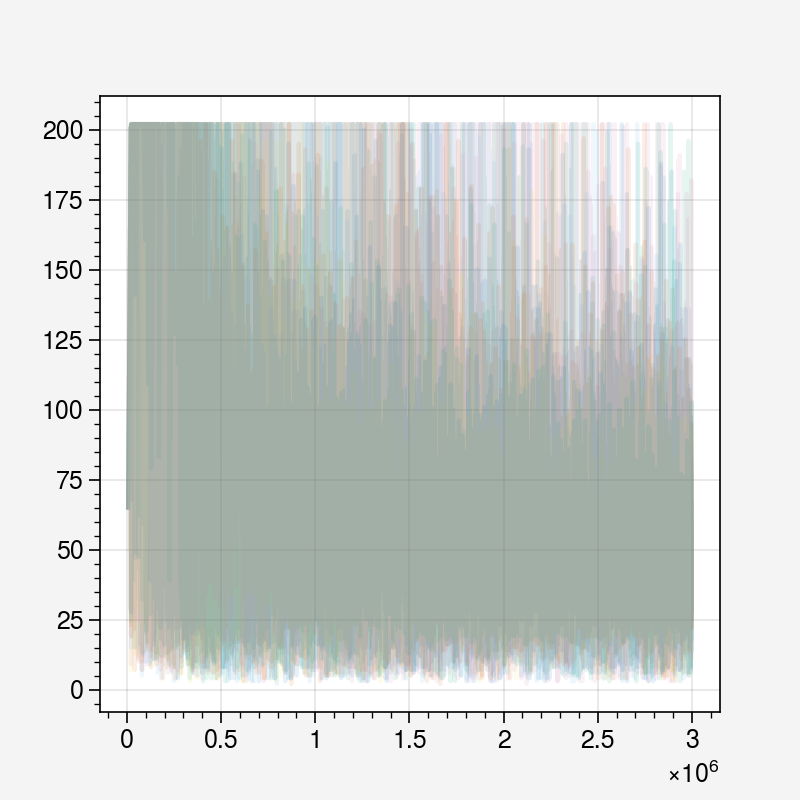

In [59]:
plt.plot(xs, ys_indiv.T, alpha=0.1)

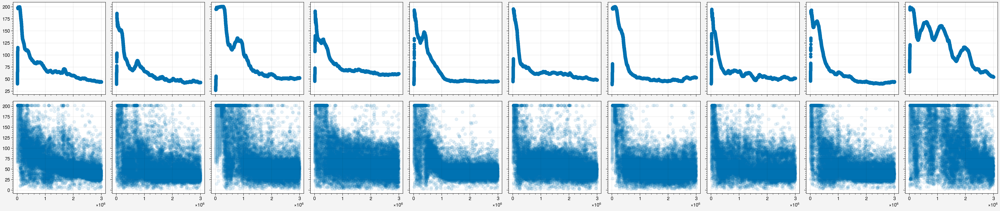

In [61]:
fig, ax = pplt.subplots(nrows=2, ncols=10)
for i in range(10):
    ax[0, i].scatter(xs, ys[i])
    ax[1, i].scatter(xs, ys_indiv[i], alpha=0.1)

In [64]:
exp_name

'nav_pdistal_auxcat/nav_pdistal_batch16auxcatfacewall'

In [99]:
df = load_exp_df(exp_name, trial_num=0)

subdf = df[df['metric'] == 'charts/episodic_length']
x = np.array(subdf['step'])
y = np.array(subdf['value'])
idx = np.argwhere(x >= timestep)[0][0]
y[idx-20:idx+20].mean()

77.275

In [ ]:
y[idx

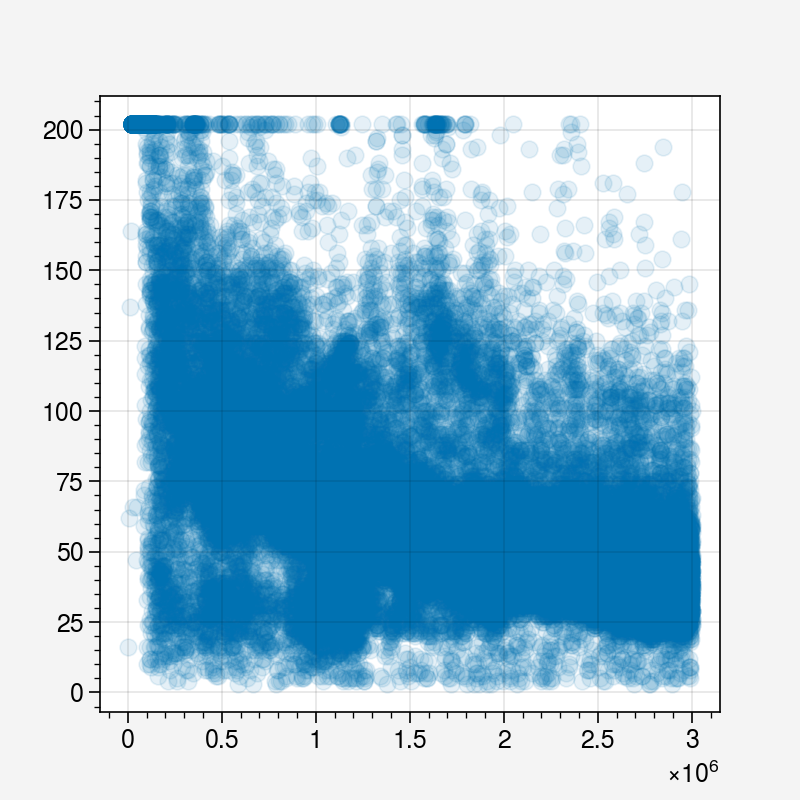

In [84]:
plt.scatter(x, y, alpha=0.1)

In [76]:
subdf

,Unnamed: 0,metric,value,step
47280,0,charts/episodic_length,16.0,1600.0
47281,1,charts/episodic_length,62.0,6200.0
47282,2,charts/episodic_length,137.0,13700.0
47283,3,charts/episodic_length,164.0,16400.0
47284,4,charts/episodic_length,202.0,20200.0
...,...,...,...,...
94555,47275,charts/episodic_length,39.0,2999800.0
94556,47276,charts/episodic_length,24.0,2999900.0
94557,47277,charts/episodic_length,47.0,2999900.0
94558,47278,charts/episodic_length,41.0,2999900.0


In [62]:
xs

array([   6500.,    6700.,    6900., ..., 2999300., 2999500., 2999700.])

In [43]:
res = evalu(model, obs_rms, env_kwargs=env_kwargs, new_aux=True, 
            auxiliary_truth_sizes=[1], n=25, seed=3, data_callback=nav_data_callback)


In [6]:
aux_tasks = ['none', 'catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Control', 'Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']

# aux = 'catfacewall'
aux = 'none'
batch = 16
chk = 300
timestep = 16 * 100 * chk
num_trials = 3

if aux == 'none':
    exp_name = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}aux{aux}'
else:
    # exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}coef1'
    exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}'

xs, ys, start_x, start_y = average_runs(exp_name, 'length', ignore_first=100, ewm=0.001,
                   ret=True)
idx = np.argwhere(xs >= timestep)[0][0]
y = ys[:num_trials, idx]

model, obs_rms, env_kwargs = load_model_and_env(exp_name, 0)

for trial in range(num_trials):
    exp_name_t = f'{exp_name}_t{trial}'
    chk_path = Path('../trained_models/checkpoint/')/exp_name_t


In [7]:
model, obs_rms = torch.load(chk_path/f'{chk}.pt')

res = evalu(model, obs_rms, env_kwargs=env_kwargs, new_aux=False, 
            auxiliary_truth_sizes=[1], n=10, )

# Collect trajectories to see unique behaviors

In [247]:
aux_tasks = ['none', 'catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Control', 'Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']
batch_sizes = [16, 32]
all_chks = {16: [0, 50, 100, 150, 300, 600, 1000, 1500],
            32: [0, 20, 40, 80, 150, 300, 600, 900]}
trials = range(10)
keep_keys = ['actions',  'data',  'dones']

# all_res = {}
# for i, batch in enumerate(batch_sizes):
#     all_res[batch] = {}
#     for aux in aux_tasks:
#         all_res[batch][aux] = {}
#         for trial in trials:
#             all_res[batch][aux][trial] = {}

for batch in batch_sizes:
    chks = all_chks[batch]
    for aux in aux_tasks:
        for trial in tqdm(trials):
            new_aux = True
            if aux == 'none':
                exp_name = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}aux{aux}'
                new_aux = False
            else:
                exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}coef1'
                
            exp_name_t = f'{exp_name}_t{trial}'
            env_kwargs = pickle.load(open(f'../trained_models/ppo/{exp_name}_env', 'rb'))
            chk_path = Path('../trained_models/checkpoint/')/exp_name_t
            
            for chk in chks:
                if chk in all_res[batch][aux][trial]:
                    continue
                model, obs_rms = torch.load(chk_path/f'{chk}.pt')
                res = evalu(model, obs_rms, env_kwargs=env_kwargs, new_aux=new_aux, 
                    auxiliary_truth_sizes=[1], n=100, data_callback=nav_data_callback)
                
                for key in list(res.keys()):
                    if key not in keep_keys:
                        del res[key]
                        
                all_res[batch][aux][trial][chk] = res

                
# aux = 'catfacewall'
# aux = 'none'
# batch = 16
# chk = 300
# timestep = 16 * 100 * chk
# num_trials = 3

# if aux == 'none':
#     exp_name = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}aux{aux}'
# else:
#     exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}coef1'
#     # exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}'

# model, obs_rms, env_kwargs = load_model_and_env(exp_name, 0)

# for trial in range(num_trials):
#     exp_name_t = f'{exp_name}_t{trial}'
#     chk_path = Path('../trained_models/checkpoint/')/exp_name_t

    
# model, obs_rms = torch.load(chk_path/f'{chk}.pt')

# res = evalu(model, obs_rms, env_kwargs=env_kwargs, new_aux=False, 
#             auxiliary_truth_sizes=[1], n=100, data_callback=nav_data_callback)

100%|████████████████████████████████| 10/10 [21:54<00:00, 131.43s/it]


In [248]:
condensed = {}
for batch in batch_sizes:
    condensed[batch] = {}
    for aux in aux_tasks:
        condensed[batch][aux] = {}
        for trial in trials:
            condensed[batch][aux][trial] = {}


for batch in all_res:
    for aux in all_res[batch]:
        for trial in all_res[batch][aux]:
            for chk in all_res[batch][aux][trial]:
                condensed[batch][aux][trial][chk] = {}
                condensed[batch][aux][trial][chk]['actions'] = torch.vstack(all_res[batch][aux][trial][chk]['actions'])
                condensed[batch][aux][trial][chk]['dones'] = np.vstack(all_res[batch][aux][trial][chk]['dones'])
                condensed[batch][aux][trial][chk]['data'] = {}
                condensed[batch][aux][trial][chk]['data']['pos'] = np.vstack(all_res[batch][aux][trial][chk]['data']['pos'])
                condensed[batch][aux][trial][chk]['data']['angle'] = np.vstack(all_res[batch][aux][trial][chk]['data']['angle'])
                
                

In [249]:
pickle.dump(condensed, open('data/trajectories/auxcatcoef1_condensed', 'wb'))

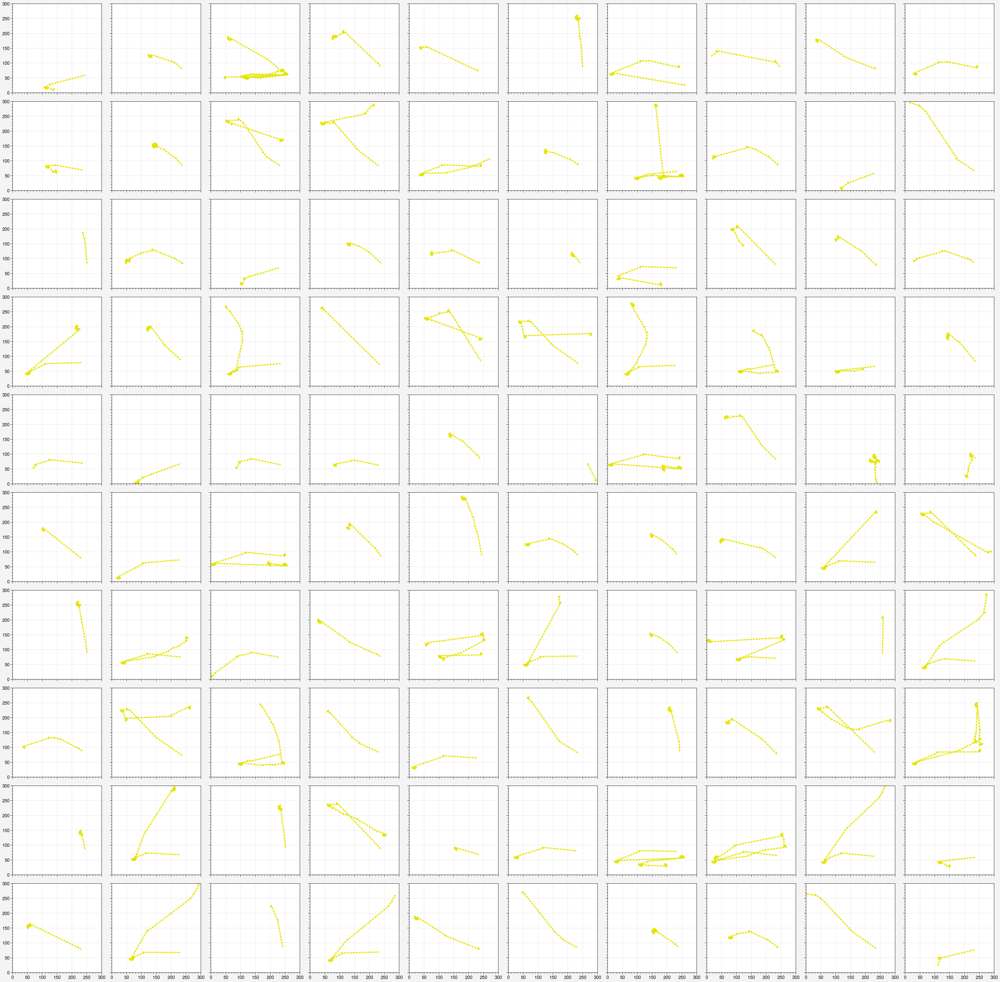

In [245]:
fig, ax = pplt.subplots(nrows=10, ncols=10)
for i, (pos, angles) in enumerate(zip(ep_pos, ep_angles)):
    for p, a in zip(pos, angles):
        draw_character(p[0], a[0], ax=ax[i])
ax.format(xlim=[0, 300], ylim=[0, 300])

## Clustering

In [4]:
aux_tasks = ['none', 'catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Control', 'Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']
batch_sizes = [16, 32]
all_chks = {16: [0, 50, 100, 150, 300, 600, 1000, 1500],
            32: [0, 20, 40, 80, 150, 300, 600, 900]}
trials = range(10)
all_res = pickle.load(open('data/trajectories/auxcatcoef1', 'rb'))

### Conversion of trajectory to image

In [123]:
import io
from PIL import Image

from fastai import *
from fastai.vision.all import *
from fastai.vision.widgets import *
import timm




def get_ep_pos_angle_from_data(res):
    '''
    Convert a res object e.g., res = all_res[batch][aux][trial][chk] to ep_pos and ep_angles
    which individual ones can be given to draw_trajectory
    '''
    ep_pos = split_by_ep(res['data']['pos'], res['dones'])
    ep_angles = split_by_ep(res['data']['angle'], res['dones'])
    ep_pos = [np.vstack(p) for p in ep_pos]
    ep_angles = [np.vstack(a) for a in ep_angles]
    
    return ep_pos, ep_angles



def draw_trajectory(pos=None, angle=None, fig=None, ax=None):
    '''Convert positions and angles into an image trajectory
    Adds a few extra details like where the start and goal reached locations are
    as well as adding increasing redness as the agent spends time in one spot rotating
    without forward movement'''
    if fig == None and ax == None:
        fig, ax = pplt.subplots()
    stopped = 0
    last_p = np.zeros(2)
    for i, (p, a) in enumerate(zip(pos, angle)):
        redness = max(0, 1-stopped*0.1)
        color = [1, redness, redness, 1]
        draw_character(p, a[0], ax=ax, color=color)

        if (p == last_p).all():
            stopped += 1
        else:
            stopped = 0
        last_p = p

    #redraw first and last steps
    draw_character(pos[0], angle[0][0], color=[0, 1, 0, 1], size=18, ax=ax)
    if len(pos) < 202:
        draw_character(pos[-1], angle[-1][0], color=[0, 1, 1, 1], size=18, ax=ax)
    ax.format(xlim=[0, 300], ylim=[0, 300])
    
    return fig, ax
    
    
def convert_trajectory_to_rgb(pos, angle, keep_rgb_dims=3, fig=None, ax=None):
    '''Given a set of positions and angles, convert trajectory into an image
    and return as an rgb array of size 224x224.
    
    Note that this requires specific rcparams from this block and plotting from proplot
    
    keep_rgb_dims: how many of the rgb dims to keep
        3: discard alpha from rgba. Only 3 dims are used for learner model'''
    fig, ax = draw_trajectory(pos, angle, fig, ax)
    #Convert to numpy array
    io_buf = io.BytesIO()
    fig.savefig(io_buf, format='raw', dpi=85.5)
    io_buf.seek(0)
    img_arr = np.reshape(np.frombuffer(io_buf.getvalue(), dtype=np.uint8),
                         newshape=(224, 224, -1))
    io_buf.close()
    pplt.close()
    
    img_arr = img_arr[:, :, :keep_rgb_dims]
    return img_arr


def classify_res(res, batch=True):
    '''Use learner to perform classification on a specific res dictionary
    
    batch: perform inference as a batch which is 4x faster (although conversion
        to images is still  the slowest part)'''
    
    ep_pos, ep_angles = get_ep_pos_angle_from_data(res)

    if batch:
        imgs = []
        for i in range(len(ep_pos)):
            img = convert_trajectory_to_rgb(ep_pos[i], ep_angles[i])
            imgs.append(img)
        
        with learner.no_bar():
            test_dl = learner.dls.test_dl(imgs)
            probs, _ = learner.get_preds(dl=test_dl)

            idxs = np.array(probs).argmax(axis=1)
            id_to_vocab = dict(zip(range(len(learner.dls.vocab)), learner.dls.vocab))
            labels = list(map(lambda x: id_to_vocab[x], idxs))
        
    else:
        # Generate predictions for each trajectory in trial
        labels = []
        idxs = []
        probs = []

        with learner.no_bar():
            for i in range(len(ep_pos)):
                img = convert_trajectory_to_rgb(ep_pos[i], ep_angles[i])
                label, idx, prob = learner.predict(img)
                labels.append(label)
                idxs.append(idx.item())
                probs.append(prob.numpy())

    return {
        'labels': labels,
        'idxs': idxs,
        'probs': probs
    }



def classify_folder(path):
    '''Use learner to perform batch classification on a directory of images
    E.g. folder = Path('data/trajectories/test_imgs/batch16_auxnone_trial0_chk900')
    '''
    with learner.no_bar():
        test_dl = learner.dls.test_dl(get_image_files(path), batch_size=100)
        probs, _ = learner.get_preds(dl=test_dl)
        
        idxs = np.array(probs).argmax(axis=1)
        id_to_vocab = dict(zip(range(len(learner.dls.vocab)), learner.dls.vocab))
        labels = list(map(lambda x: id_to_vocab[x], idxs))
        
    return {
        'labels': labels,
        'idxs': idxs,
        'probs': probs
    }

    
    


'''Trajectory image saving functions'''

img_folder = Path('data/trajectories/imgs')
'''Create folder in data folder'''
id_to_label = {
    0: 'favorite_spot',
    1: 'direct',
    2: 'near_miss',
    3: 'circling',
    4: 'test_corner',
    5: 'uncertain_direct',
    6: 'stuck'
}
for _, label in id_to_label.items():
    folder = img_folder/label
    folder.mkdir(exist_ok=True)

def save_trajectory(pos, angle, file):
    img_arr = convert_trajectory_to_rgb(pos, angle)

    im = Image.fromarray(img_arr)
    im.save(file)
    
    
    
'''
Plotting functions
'''

def generate_grid_array(n):
    '''
    Generate an array that is used by proplot subplots to create a
    grid that is as close to a square number as possible
    '''
    box_len = int(np.ceil(np.sqrt(n)))
    n_rows = int(np.ceil(n / box_len))
    last_row_remainder = box_len - (n % box_len)
    left_missing = int(np.floor(last_row_remainder / 2))
    right_missing = int(np.ceil(last_row_remainder / 2))

    # How many full rows to add by using np.arange
    aranged_rows = n_rows - 1
    if last_row_remainder == box_len:
        aranged_rows += 1
    
    # Add in those rows
    array = []
    for i in range(aranged_rows):
        array.append(np.arange(i*box_len+1, ((i+1)*box_len)+1))
        last_idx = array[-1][-1]    

    # Generate a last row with symmetric missing plots if needed
    if last_row_remainder != box_len:
        last_row = np.zeros(box_len)
        for i in range(left_missing, box_len - right_missing):
            last_row[i] = last_idx + 1
            last_idx += 1
        array.append(last_row)
        
        
    array = np.vstack(array).astype('int')
    return array


def set_trajectory_plot_style(reset=False):
    '''Set up rc params for proplot so that we get nice images to feed into
    the visual system for ananlysis
    
    If reset == True, revert to default rcprams for normal plotting'''
    if reset:
        pplt.rc.reset()
    else:
        pplt.rc.update({
            'axes.spines.bottom': False,
            'axes.spines.top': False,
            'axes.spines.left': False,
            'axes.spines.right': False,
            'axes.facecolor': 'black',
            'axes.grid': False
        })
    
#Note we call set_trajectory_plot_style here
set_trajectory_plot_style()

In [723]:
batch = 32
aux = 'catwall0'
trial = 0
chk = 150
res = all_res[batch][aux][trial][chk]

ep_pos = split_by_ep(res['data']['pos'], res['dones'])
ep_angles = split_by_ep(res['data']['angle'], res['dones'])
ep_pos = [np.vstack(p) for p in ep_pos]
ep_angles = [np.vstack(a) for a in ep_angles]

In [304]:
imgs = np.zeros((100, 224, 224, 4))
for i in tqdm(range(100)):
    #Generate plot
    fig, ax = pplt.subplots()
    pos, angle = ep_pos[i], ep_angles[i]
    for p, a in zip(pos, angle):
        draw_character(p, a[0], ax=ax)
    ax.format(xlim=[0, 300], ylim=[0, 300])
    
    #Convert to numpy array
    io_buf = io.BytesIO()
    fig.savefig(io_buf, format='raw', dpi=85.5)
    io_buf.seek(0)
    img_arr = np.reshape(np.frombuffer(io_buf.getvalue(), dtype=np.uint8),
                         newshape=(224, 224, -1))
    io_buf.close()
    pplt.close()
    
    imgs[i] = img_arr


100%|██████████████████████████████████████████████████████| 100/100 [00:28<00:00,  3.54it/s]


In [296]:
io_buf = io.BytesIO()
fig.savefig(io_buf, format='raw', dpi=85.5)
io_buf.seek(0)
img_arr = np.reshape(np.frombuffer(io_buf.getvalue(), dtype=np.uint8),
                     newshape=(224, 224, -1))
io_buf.close()

## Manually create labels

In [838]:
'''Load up positions and angles'''

batch = 16
aux = 'none'
trial = 0
chk = 300
res = all_res[batch][aux][trial][chk]

ep_pos = split_by_ep(res['data']['pos'], res['dones'])
ep_angles = split_by_ep(res['data']['angle'], res['dones'])
ep_pos = [np.vstack(p) for p in ep_pos]
ep_angles = [np.vstack(a) for a in ep_angles]

In [788]:
'''Setup label holder'''
labels = []
cur_idx = 0


(Figure(nrows=1, ncols=1, refwidth=2.5),
 SubplotGrid(nrows=1, ncols=1, length=1))

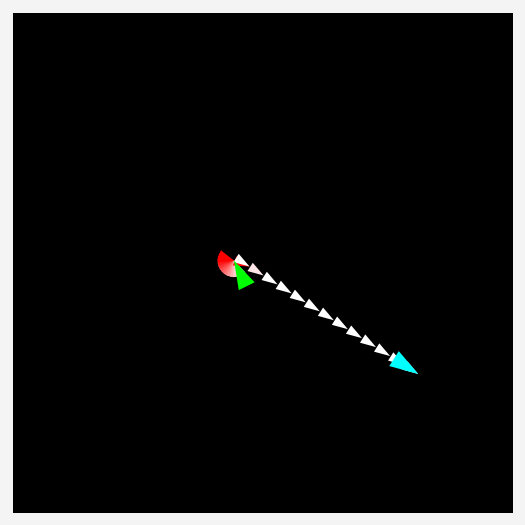

In [835]:
'''Draw the image (Repeat this and the following code block to assign labels)'''
pos, angle = ep_pos[cur_idx], ep_angles[cur_idx]
draw_trajectory(pos, angle)

In [836]:
'''Assign a label
0: favorite spot
1: direct
2: near miss
3: circling
4: test corner
5: uncertain direct
6: stuck
'''
label = 1

labels.append(label)
print(f'Label: {label} assigned to idx {cur_idx}')


cur_idx += 1

Label: 1 assigned to idx 23


In [837]:
'''Save images with their labels (Run this block after satisfied with labeling)'''
for i in range(len(labels)):
    pos, angle = ep_pos[i], ep_angles[i]
    label = id_to_label[labels[i]]
    name = f'{batch}_{aux}_{trial}_{chk}_{i}.png'
    file = img_folder/label/name
    
    save_trajectory(pos, angle, file)
    
    
'''Save remaining images without label'''
for j in range(i, 100):
    pos, angle = ep_pos[j], ep_angles[j]
    name = f'{batch}_{aux}_{trial}_{chk}_{j}.png'
    file = img_folder/'unlabeled'/name
    
    save_trajectory(pos, angle, file)

## Train an imagenet

In [1058]:
# Generate data loader
img_folder = Path('data/trajectories/imgs')
# get_image_files_in_folders = lambda path: get_image_files(path, folders=list(id_to_label.values()))

folders = ['circling', 'direct', 'stuck', 'test_corner', 'uncertain_direct']
get_image_files_in_folders = lambda path: get_image_files(path, folders=folders)
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files_in_folders,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label
).dataloaders(img_folder)

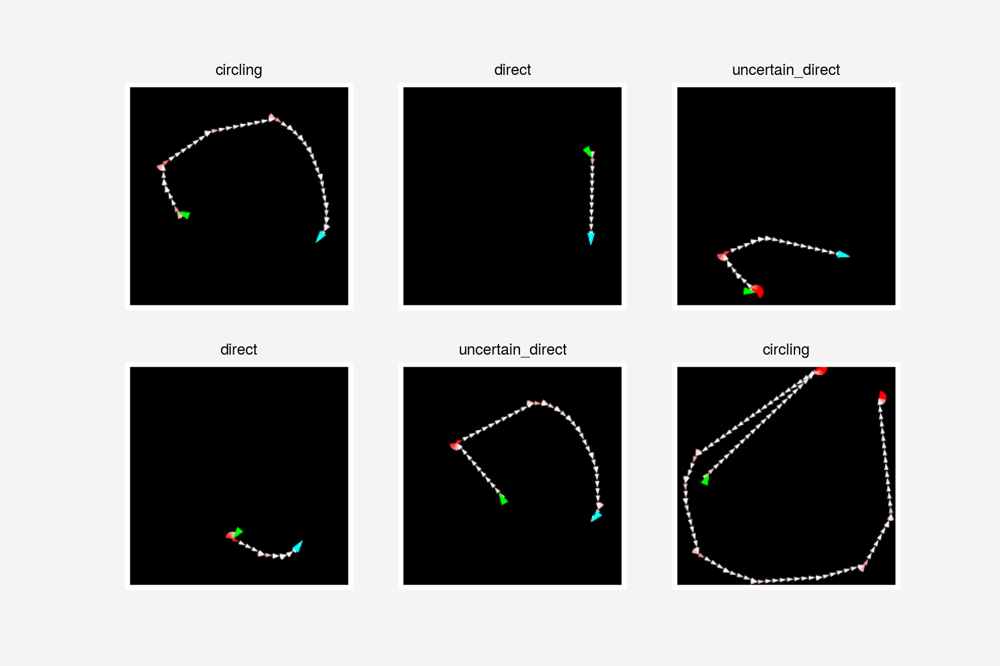

In [1059]:
dls.show_batch(max_n=6)

In [1060]:
learn = vision_learner(dls, 'convnext_tiny_in22k', metrics=error_rate)
learn.fine_tune(12)

epoch,train_loss,valid_loss,error_rate,time
0,2.169320,1.811298,0.460870,01:07


epoch,train_loss,valid_loss,error_rate,time
0,0.876013,0.805685,0.295652,01:42
1,0.691749,0.636755,0.243478,01:39
2,0.590717,0.647749,0.260870,01:40
3,0.514103,0.738419,0.226087,01:42
4,0.421923,0.685764,0.234783,01:40
5,0.354690,0.697309,0.234783,01:40
6,0.303380,0.694230,0.208696,01:40
7,0.266511,0.708965,0.234783,01:38
8,0.231600,0.705971,0.243478,01:39


KeyboardInterrupt: 

In [1061]:
learn.export('data/trajectories/classifier_moredata.pkl')

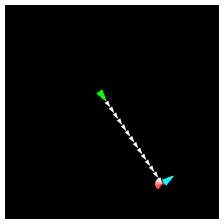

In [883]:
unlabeled_images = get_image_files(img_folder, folders='unlabeled')
img = PILImage.create(unlabeled_images[4])
img

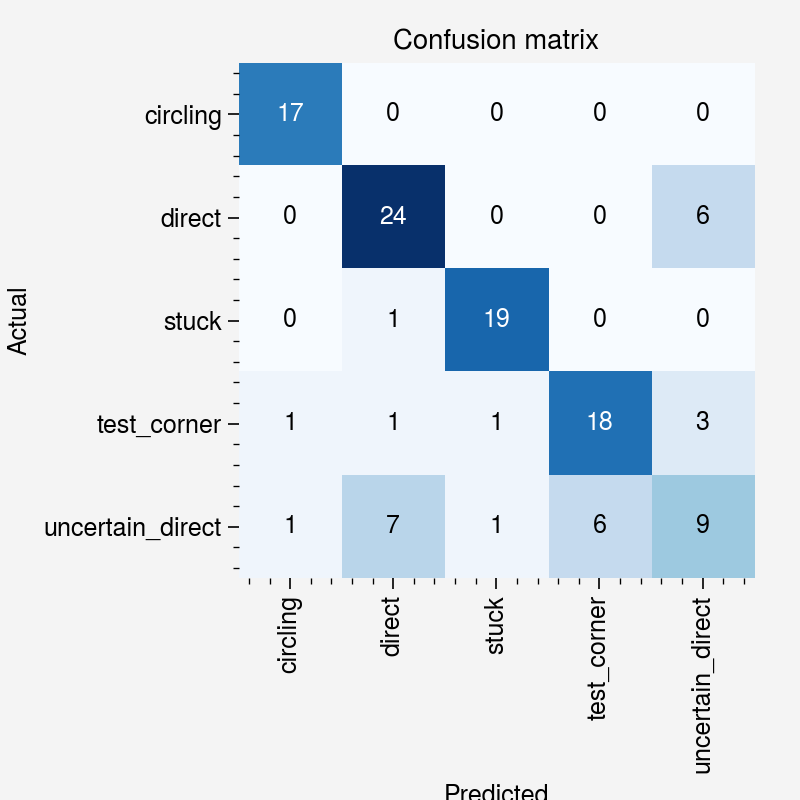

In [1063]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [1062]:
cleaner = ImageClassifierCleaner(learn)
cleaner

## Train model on all data no validation holds

In [85]:
# Generate data loader
img_folder = Path('data/trajectories/imgs')
# get_image_files_in_folders = lambda path: get_image_files(path, folders=list(id_to_label.values()))

folders = ['circling', 'direct', 'stuck', 'test_corner', 'uncertain_direct']
get_image_files_in_folders = lambda path: get_image_files(path, folders=folders)
dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files_in_folders,
    splitter=RandomSplitter(valid_pct=0.1, seed=42),
    get_y=parent_label
).dataloaders(img_folder)

In [86]:
learner = vision_learner(dls, 'convnext_tiny_in22k', metrics=error_rate)
learner.fine_tune(6, cbs=[SaveModelCallback, EarlyStoppingCallback])

epoch,train_loss,valid_loss,error_rate,time
0,1.810625,1.416540,0.417910,01:14


Better model found at epoch 0 with valid_loss value: 1.4165395498275757.


epoch,train_loss,valid_loss,error_rate,time
0,0.797489,0.440543,0.194030,02:00
1,0.639083,0.276094,0.089552,01:53
2,0.487666,0.327523,0.089552,01:52


Better model found at epoch 0 with valid_loss value: 0.4405427873134613.
Better model found at epoch 1 with valid_loss value: 0.2760937511920929.
No improvement since epoch 1: early stopping


In [121]:
learner.validate()

(#2) [0.2760937511920929,0.08955223858356476]

In [122]:
learner.export('data/trajectories/classifier_moredata.pkl')

## Use trained model to perform classification

In [131]:
aux_tasks = ['none', 'catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Control', 'Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']
batch_sizes = [16, 32]
all_chks = {16: [0, 50, 100, 150, 300, 600, 1000, 1500],
            32: [0, 20, 40, 80, 150, 300, 600, 900]}
trials = range(10)
all_res = pickle.load(open('data/trajectories/auxcatcoef1', 'rb'))
# learner = load_learner('data/trajectories/classifier.pkl')
learner = load_learner('data/trajectories/classifier_moredata.pkl')

In [25]:
batch = 16
aux = 'catfacewall'
trial = 0
chk = 1000

res = all_res[batch][aux][trial][chk]

ep_pos, ep_angles = split_by_ep(res['data']['pos'], res['dones']), split_by_ep(res['data']['angle'], res['dones'])
ep_pos, ep_angles = [np.vstack(p) for p in ep_pos], [np.vstack(a) for a in ep_angles]

In [1069]:
#limited classification run
batch_sizes = [16, 32]
all_chks = {16: [300, 1500], 32: [150, 900]}
trials = range(2)

# If continue_classification, load up previous classifications and add to it any
#   classifications that are missing from the parameters above
# Otherwise, create new classification result object
continue_classification = False

if continue_classification:
    class_res = pickle.load(open('data/trajectories/classification_results', 'rb'))
else:
    class_res = {}


for batch in batch_sizes:
    if batch not in class_res: class_res[batch] = {}
    for aux in tqdm(aux_tasks):
        if aux not in class_res[batch]: class_res[batch][aux] = {}
        for trial in trials:
            if trial not in class_res[batch][aux]: class_res[batch][aux][trial] = {}
            chks = all_chks[batch]

            for chk in chks:
                if chk in class_res[batch][aux][trial]:
                    continue

                res = all_res[batch][aux][trial][chk]
                class_res[batch][aux][trial][chk] = classify_res(res)
                
pickle.dump(class_res, open('data/trajectories/classification_results_fullmodel', 'wb'))
        
    
    

# imgs = [convert_trajectory_to_rgb(ep_pos[i], ep_angles[i]) for i in range(len(ep_pos))]

  0%|                                                                                            | 0/6 [01:18<?, ?it/s]

KeyboardInterrupt



### Streamline inference

In [4]:
'''Convert all trajectories into png images which take 4kb each instead of
140kb in pickle. These will also be easier to load'''


for batch in [32]:
    for aux in aux_tasks:
        print(batch, aux)
        for trial in tqdm(trials):
            chks = all_chks[batch]
            for chk in chks:
                
                res = all_res[batch][aux][trial][chk]
                ep_pos, ep_angles = get_ep_pos_angle_from_data(res)

                folder_name = f'batch{batch}_aux{aux}_trial{trial}_chk{chk}'
                folder = Path('data/trajectories/test_imgs/')/folder_name
                folder.mkdir(exist_ok=True)

                for i in range(len(ep_pos)):
                    file = folder/f'{i}.png'
                    if not file.exists():
                        save_trajectory(ep_pos[i], ep_angles[i], file)
    

32 none


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.69it/s]


32 catfacewall


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  2.97it/s]


32 catquad


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  2.79it/s]


32 catwall01


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  2.75it/s]


32 catwall0


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  2.66it/s]


32 catwall1


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [13:28<00:00, 80.81s/it]


In [ ]:
'''Code block to fix some errors in the saved file SHOULD NOT NEED TO RUN AGAIN'''


class_res = pickle.load(open('data/trajectories/classification_results', 'rb'))

check_chks = {16: [1000, 600, 1500], 32: [600, 900]}
array_chks = {16: [600], 32: [600]}

for batch in batch_sizes:
    for trial in range(5):
        for aux in aux_tasks:
            chks = check_chks[batch]
            for chk in chks:
                # Clear out empty chks
                if chk in class_res[batch][aux][trial]:            
                    if 'idxs' not in class_res[batch][aux][trial][chk]:
                        del class_res[batch][aux][trial][chk]
                    
            chks = array_chks[batch]
            for chk in chks:
                class_res[batch][aux][trial][chk]['idxs'] = np.array(class_res[batch][aux][trial][chk]['idxs'])
                
pickle.dump(class_res, open('data/trajectories/classification_results', 'wb'))

In [132]:
'''
Perform inference on saved images
'''

lim_chks = {16: [600], 32: [600]}

continue_classification = True

if continue_classification:
    class_res = pickle.load(open('data/trajectories/classification_results_moredata', 'rb'))
else:
    class_res = {}
    
for batch in batch_sizes:
    if batch not in class_res: class_res[batch] = {}
    
    for aux in tqdm(aux_tasks):
        if aux not in class_res[batch]: class_res[batch][aux] = {}
        
        # Choose here whether to run limited checkpoints or all checkpoints
        # chks = lim_chks[batch]
        chks = all_chks[batch]
        
        for trial in range(10):
            if trial not in class_res[batch][aux]: class_res[batch][aux][trial] = {}
            
            for chk in chks:
                if chk in class_res[batch][aux][trial]:
                    continue

                folder = f'data/trajectories/test_imgs/batch{batch}_aux{aux}_trial{trial}_chk{chk}'
                res = classify_folder(folder)
                class_res[batch][aux][trial][chk] = res

pickle.dump(class_res, open('data/trajectories/classification_results_moredata', 'wb'))


100%|███████████████████████████████████████████████████████████████████████████████████| 6/6 [50:55<00:00, 509.30s/it]


### Compare new model to old results

In [25]:
class_res_old = pickle.load(open('data/trajectories/classification_results', 'rb'))


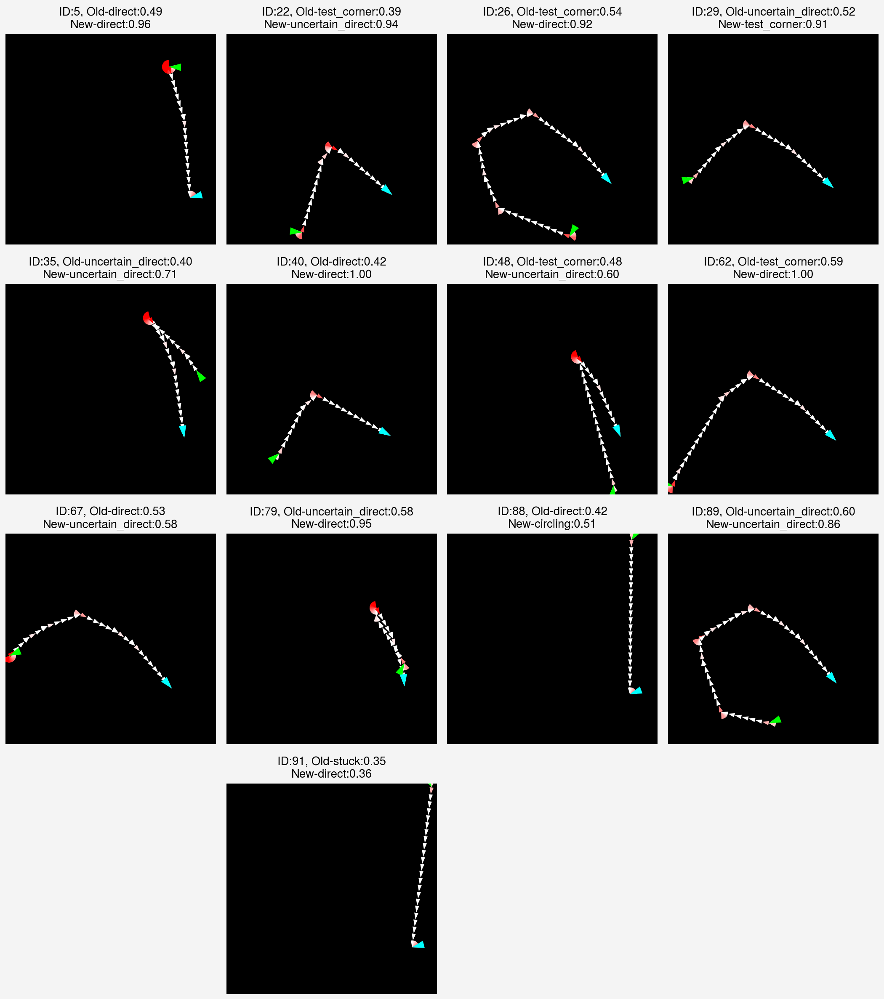

In [119]:
batch = 16
aux = 'none'
trial = 1

chk = 600

res = all_res[batch][aux][trial][chk]

probs_old = np.vstack(class_res_old[batch][aux][trial][chk]['probs'])
idxs_old = np.array(class_res_old[batch][aux][trial][chk]['idxs'])
labels_old = np.array(class_res_old[batch][aux][trial][chk]['labels'])
prob_max_old = np.max(probs_old, axis=1)

probs = np.vstack(class_res[batch][aux][trial][chk]['probs'])
idxs = np.array(class_res[batch][aux][trial][chk]['idxs'])
labels = np.array(class_res[batch][aux][trial][chk]['labels'])
prob_max = np.max(probs, axis=1)


plot_idxs = np.argwhere(prob_max_old < 0.6).squeeze()

ep_pos, ep_angles = get_ep_pos_angle_from_data(res)

fig, ax = pplt.subplots(array=generate_grid_array(len(plot_idxs)))
for i, idx in enumerate(plot_idxs):
    draw_trajectory(ep_pos[idx], ep_angles[idx], fig=fig, ax=ax[i])

    
ax.format(title=[f'ID:{i}, Old-{labels_old[i]}:{prob_max_old[i]:.2f}\nNew-{labels[i]}:{prob_max[i]:.2f}' 
                 for i in plot_idxs])



<BarContainer object of 5 artists>

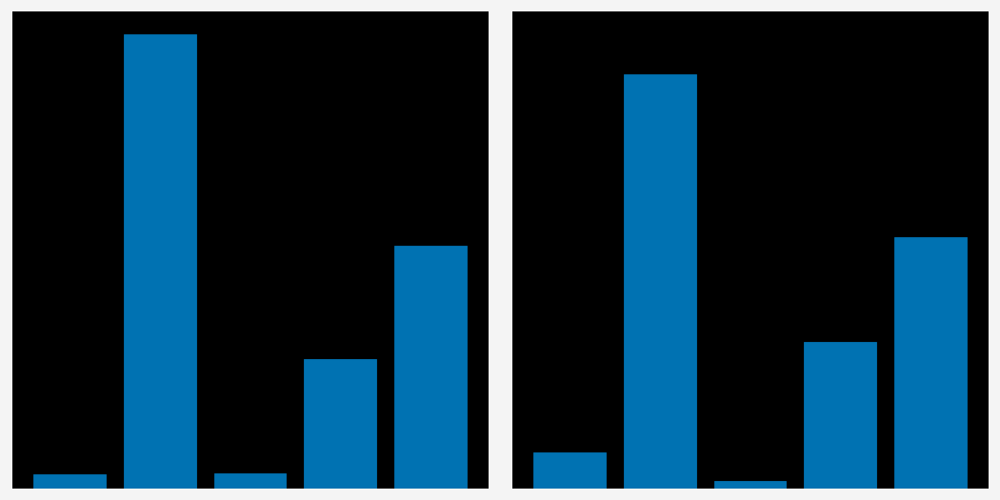

In [120]:
fig, ax = pplt.subplots(ncols=2)
# ax[0].bar(range(5), [(idxs == i).sum() for i in range(5)])
ax[0].bar(range(5), probs_old.sum(axis=0))
ax[1].bar(range(5), probs.sum(axis=0))

In [90]:
learner.dls.vocab

['circling', 'direct', 'stuck', 'test_corner', 'uncertain_direct']

### Plot results of classification

In [28]:
# Final visual model results

aux_tasks = ['none', 'catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Control', 'Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']
batch_sizes = [16, 32]
all_chks = {16: [0, 50, 100, 150, 300, 600, 1000, 1500],
            32: [0, 20, 40, 80, 150, 300, 600, 900]}
trials = range(10)

class_res = pickle.load(open('data/trajectories/classification_results_moredata', 'rb'))
learner = load_learner('data/trajectories/classifier_moredata.pkl')

aranged_vocab = { #ordering labels and their corresponding idx by importance
    1: 'direct',
    4: 'uncertain_direct',
    3: 'test_corner',
    0: 'circling',
    2: 'stuck'
}

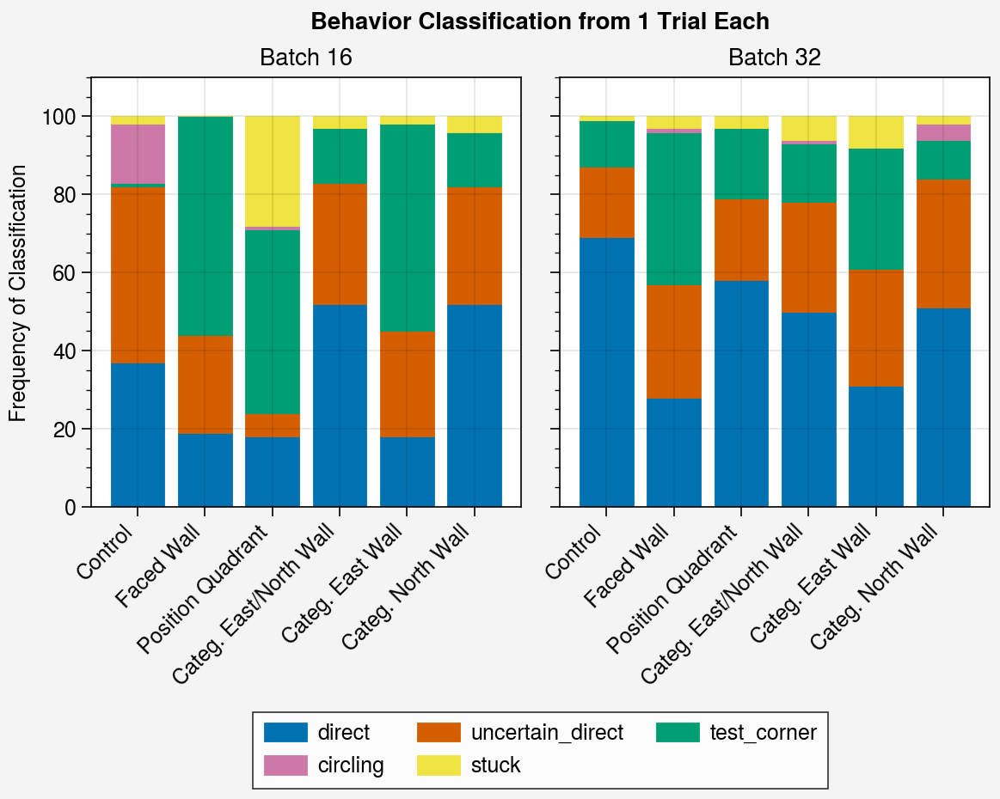

In [156]:
aranged_vocab = { #ordering labels and their corresponding idx by importance
    1: 'direct',
    4: 'uncertain_direct',
    3: 'test_corner',
    0: 'circling',
    2: 'stuck'
}

fig, ax = pplt.subplots(ncols=len(batch_sizes))
for i, batch in enumerate(batch_sizes):
    xs = []
    ys = []
    for j, aux in enumerate(aux_tasks):
        trial = 0
        # chk = all_chks[batch][0]
        chk = 600
        res = class_res[batch][aux][trial][chk]
        
        #Count up amount of each label
        
        #remove the tensor.item() piece next time we run classification
        y = np.array([idx.item() for idx in res['idxs']])
        counts = []
        for idx in aranged_vocab:
            counts.append((y == idx).sum())
        
        ys.append(counts)
        xs.append(j)
        
    bars = np.array(ys).T
    prev_bar = np.zeros(bars.shape[1])
    labels = list(aranged_vocab.values())
    bar_plots = []
    for n, bar in enumerate(bars):
        bar_plots.append(ax[i].bar(bar, bottom=prev_bar, label=labels[n]))
        prev_bar += bar
    
fig.legend(bar_plots, loc='b')

ax.format(ylim=[0, 110], xticklabels=aux_labels, xlocator=range(6),
         title=[f'Batch {batch}' for batch in batch_sizes],
         ylabel='Frequency of Classification',
         suptitle='Behavior Classification from 1 Trial Each')
ax.format(xrotation=45)

In [31]:
color_cycle()

array([[0.12156863, 0.46666667, 0.70588235],
       [1.        , 0.49803922, 0.05490196],
       [0.17254902, 0.62745098, 0.17254902],
       [0.83921569, 0.15294118, 0.15686275],
       [0.58039216, 0.40392157, 0.74117647],
       [0.54901961, 0.3372549 , 0.29411765],
       [0.89019608, 0.46666667, 0.76078431],
       [0.49803922, 0.49803922, 0.49803922],
       [0.7372549 , 0.74117647, 0.13333333],
       [0.09019608, 0.74509804, 0.81176471]])

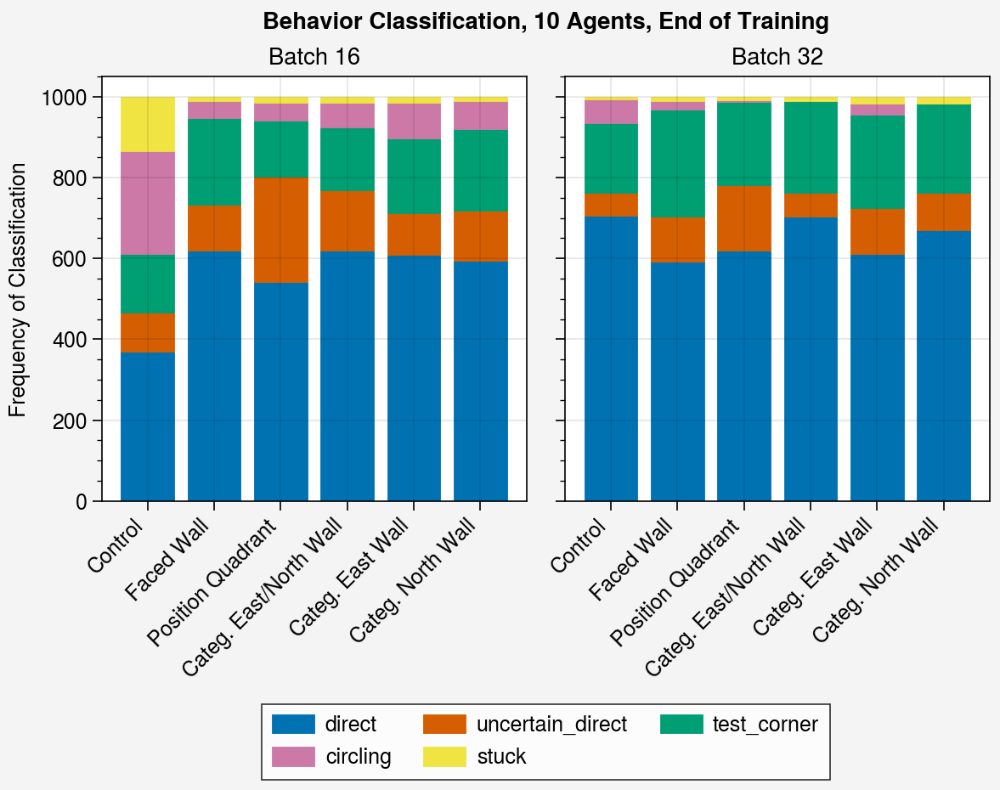

In [8]:
#limited classification run
batch_sizes = [16, 32]
all_chks = {16: [1500], 32: [900]}
trials = range(10)


aranged_vocab = { #ordering labels and their corresponding idx by importance
    1: 'direct',
    4: 'uncertain_direct',
    3: 'test_corner',
    0: 'circling',
    2: 'stuck'
}

fig, ax = pplt.subplots(ncols=len(batch_sizes))
for i, batch in enumerate(batch_sizes):
    xs = []
    ys = []
    for j, aux in enumerate(aux_tasks):
        counts = np.zeros(len(aranged_vocab))
        chk = all_chks[batch][0]
        
        for trial in trials:
            res = class_res[batch][aux][trial][chk]

            #Count up amount of each label
            y = np.array([idx for idx in res['idxs']])
            for n, idx in enumerate(aranged_vocab):
                counts[n] += (y == idx).sum()
            # for idx in aranged_vocab:
            #     counts.append((y == idx).sum())
        ys.append(list(counts))
        xs.append(j)
        
    bars = np.array(ys).T
    prev_bar = np.zeros(bars.shape[1])
    labels = list(aranged_vocab.values())
    bar_plots = []
    for n, bar in enumerate(bars):
        bar_plots.append(ax[i].bar(bar, bottom=prev_bar, label=labels[n]))
        prev_bar += bar
    
fig.legend(bar_plots, loc='b')

ax.format(ylim=[0, 1050], xticklabels=aux_labels, xlocator=range(6),
         title=[f'Batch {batch}' for batch in batch_sizes],
         ylabel='Frequency of Classification',
         suptitle='Behavior Classification, 10 Agents, End of Training')
ax.format(xrotation=45)

In [7]:
pplt.rc.reset()

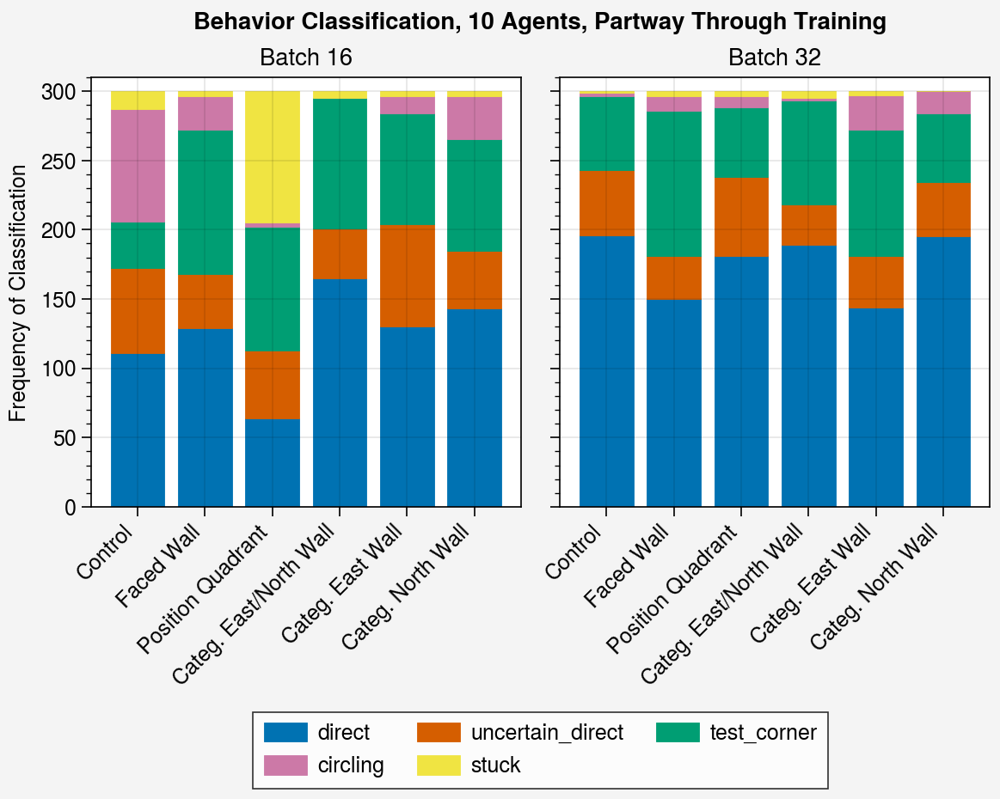

In [9]:
#limited classification run
batch_sizes = [16, 32]
all_chks = {16: [600], 32: [600]}
trials = range(3)


aranged_vocab = { #ordering labels and their corresponding idx by importance
    1: 'direct',
    4: 'uncertain_direct',
    3: 'test_corner',
    0: 'circling',
    2: 'stuck'
}

fig, ax = pplt.subplots(ncols=len(batch_sizes))
for i, batch in enumerate(batch_sizes):
    xs = []
    ys = []
    for j, aux in enumerate(aux_tasks):
        counts = np.zeros(len(aranged_vocab))
        chk = all_chks[batch][0]
        
        for trial in trials:
            res = class_res[batch][aux][trial][chk]

            #Count up amount of each label
            y = np.array([idx for idx in res['idxs']])
            for n, idx in enumerate(aranged_vocab):
                counts[n] += (y == idx).sum()
            # for idx in aranged_vocab:
            #     counts.append((y == idx).sum())
        ys.append(list(counts))
        xs.append(j)
        
    bars = np.array(ys).T
    prev_bar = np.zeros(bars.shape[1])
    labels = list(aranged_vocab.values())
    bar_plots = []
    for n, bar in enumerate(bars):
        bar_plots.append(ax[i].bar(bar, bottom=prev_bar, label=labels[n]))
        prev_bar += bar
    
fig.legend(bar_plots, loc='b')

ax.format(ylim=[0, 100*len(trials)+10], xticklabels=aux_labels, xlocator=range(6),
         title=[f'Batch {batch}' for batch in batch_sizes],
         ylabel='Frequency of Classification',
         suptitle='Behavior Classification, 10 Agents, Partway Through Training')
ax.format(xrotation=45)

### Evolution of categories over training

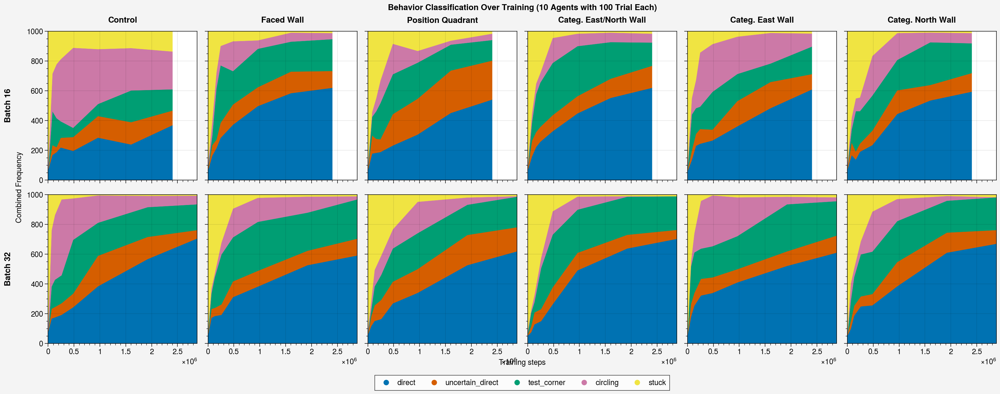

In [33]:
fig, ax = pplt.subplots(nrows=len(batch_sizes), ncols=len(aux_tasks))


aranged_vocab = { #ordering labels and their corresponding idx by importance
    1: 'direct',
    4: 'uncertain_direct',
    3: 'test_corner',
    0: 'circling',
    2: 'stuck'
}


for i, batch in enumerate(batch_sizes):
    for j, aux in enumerate(aux_tasks):
        chks = all_chks[batch]
        xs = []
        ys = [[] for i in range(len(aranged_vocab))]
        for chk in chks:
            xs.append(chk * 100 * batch)

            counts = [0 for i in range(len(aranged_vocab))]
            for trial in trials:
                res = class_res[batch][aux][trial][chk]

                #Count up amount of each label
                y = np.array([idx for idx in res['idxs']])
                for n, idx in enumerate(aranged_vocab):
                    counts[n] += (y == idx).sum()

            for n in range(len(counts)):
                ys[n].append(counts[n])

        ax[i, j].stackplot(xs, *ys)

rgb_colors = color_cycle('colorblind')
ls = []
for n, label in enumerate(aranged_vocab.values()):
     ls.append(ax[0,0].scatter([0], [-100], label=label, c=rgb_colors[n]))
        
ax.format(xlabel='Training steps', ylabel='Combined Frequency',
          suptitle='Behavior Classification Over Training (10 Agents with 100 Trial Each)',
          toplabels=aux_labels, leftlabels=[f'Batch {batch}' for batch in batch_sizes],
          ylim=[0, 1000])

fig.legend(ls, loc='b', ncols=5)



## Use model to add more labeled examples to training set

Here we will use the image classification model which has been used to make some classification plots to add examples to the training samples and refine the model even further. This is especially important to add examples where the model seemed unsure, as there are probably edge cases that are harder to distinguish and that would make for useful examples

In [123]:

chk = 900

probs = np.vstack(class_res[batch][aux][trial][chk]['probs'])
idxs = np.array(class_res[batch][aux][trial][chk]['idxs'])
labels = np.array(class_res[batch][aux][trial][chk]['labels'])
prob_max = np.max(probs, axis=1)

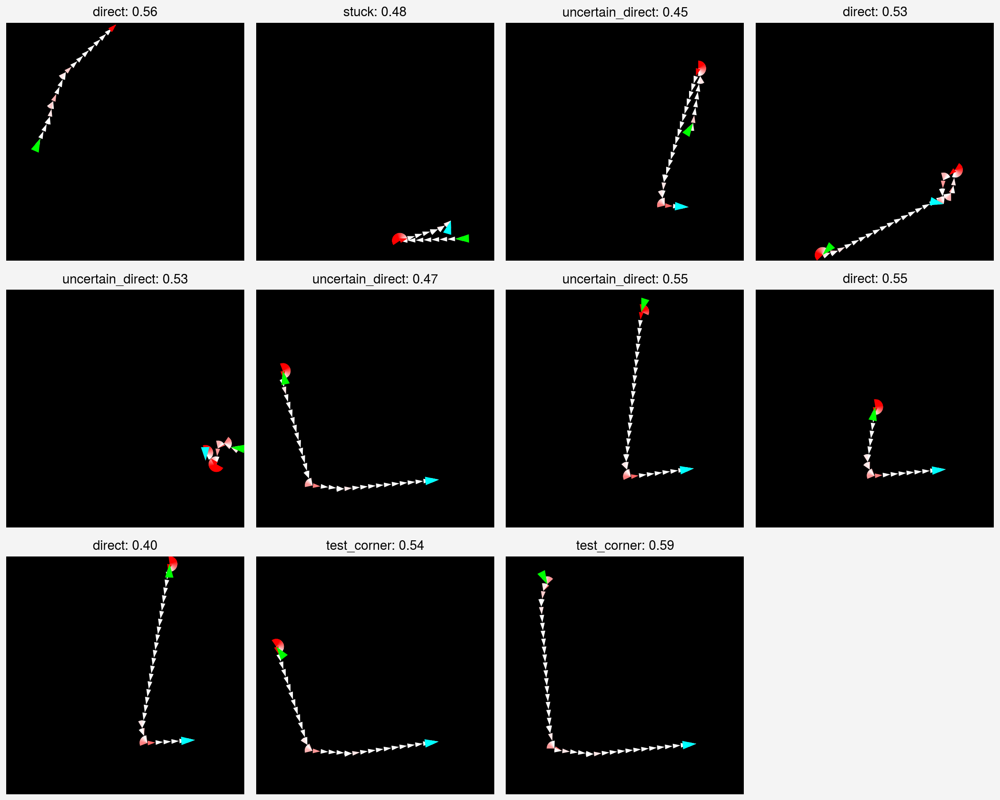

In [210]:
res = all_res[batch][aux][trial][chk]

plot_idxs = np.argwhere(prob_max < 0.6).squeeze()

ep_pos, ep_angles = get_ep_pos_angle_from_data(res)

fig, ax = pplt.subplots(array=generate_grid_array(len(plot_idxs)))
for i, idx in enumerate(plot_idxs):
    draw_trajectory(ep_pos[idx], ep_angles[idx], fig=fig, ax=ax[i])

ax.format(title=[f'{labels[i]}: {prob_max[i]:.2f}' for i in plot_idxs])

**Load and find low probability predictions**

In [1028]:
batch = 32
aux = 'catwall01'
trial = 0
chk = 900

probs = np.vstack(class_res[batch][aux][trial][chk]['probs'])
pred_idxs = np.array(class_res[batch][aux][trial][chk]['idxs'])
pred_labels = np.array(class_res[batch][aux][trial][chk]['labels'])
prob_max = np.max(probs, axis=1)

res = all_res[batch][aux][trial][chk]
plot_idxs = np.argwhere(prob_max < 0.7).squeeze()
ep_pos, ep_angles = get_ep_pos_angle_from_data(res)



In [1029]:
'''Setup label holder'''
labels = []
added_plot_idxs = []
cur_idx = 0


In [1046]:
cur_idx += 1

Current prediction - uncertain_direct: 0.65
90


(Figure(nrows=1, ncols=1, refwidth=2.5),
 SubplotGrid(nrows=1, ncols=1, length=1))

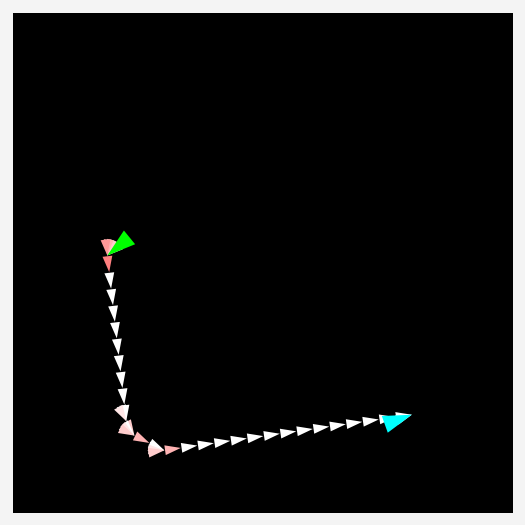

In [1055]:
'''Draw the image (Repeat this and the following code block to assign labels)'''

idx = plot_idxs[cur_idx]

print(f'Current prediction - {pred_labels[idx]}: {prob_max[idx]:.2f}')
print(idx)

pos, angle = ep_pos[idx], ep_angles[idx]
draw_trajectory(pos, angle)


In [1054]:
'''Assign a label
0: favorite spot
1: direct
2: near miss
3: circling
4: test corner
5: uncertain direct
6: stuck
'''
label = 1

labels.append(label)
added_plot_idxs.append(idx)

print(f'{cur_idx+1} out of {len(plot_idxs)}')
print(f'Label: {label} assigned to idx {idx}')

cur_idx += 1

13 out of 18
Label: 1 assigned to idx 83


In [1056]:
'''Save images with their labels (Run this block after satisfied with labeling)'''
for i in range(len(labels)):
    idx = added_plot_idxs[i]
    
    pos, angle = ep_pos[idx], ep_angles[idx]
    label = id_to_label[labels[i]]
    name = f'{batch}_{aux}_{trial}_{chk}_{idx}.png'
    file = img_folder/label/name
    
    print(file)
    save_trajectory(pos, angle, file)
    
    
# '''Save remaining images without label'''
# for j in range(i, 100):
#     pos, angle = ep_pos[j], ep_angles[j]
#     name = f'{batch}_{aux}_{trial}_{chk}_{j}.png'
#     file = img_folder/'unlabeled'/name
    
#     save_trajectory(pos, angle, file)

data\trajectories\imgs\uncertain_direct\32_catwall01_0_900_18.png
data\trajectories\imgs\direct\32_catwall01_0_900_25.png
data\trajectories\imgs\direct\32_catwall01_0_900_40.png
data\trajectories\imgs\uncertain_direct\32_catwall01_0_900_41.png
data\trajectories\imgs\direct\32_catwall01_0_900_45.png
data\trajectories\imgs\uncertain_direct\32_catwall01_0_900_71.png
data\trajectories\imgs\test_corner\32_catwall01_0_900_72.png
data\trajectories\imgs\direct\32_catwall01_0_900_73.png
data\trajectories\imgs\direct\32_catwall01_0_900_83.png


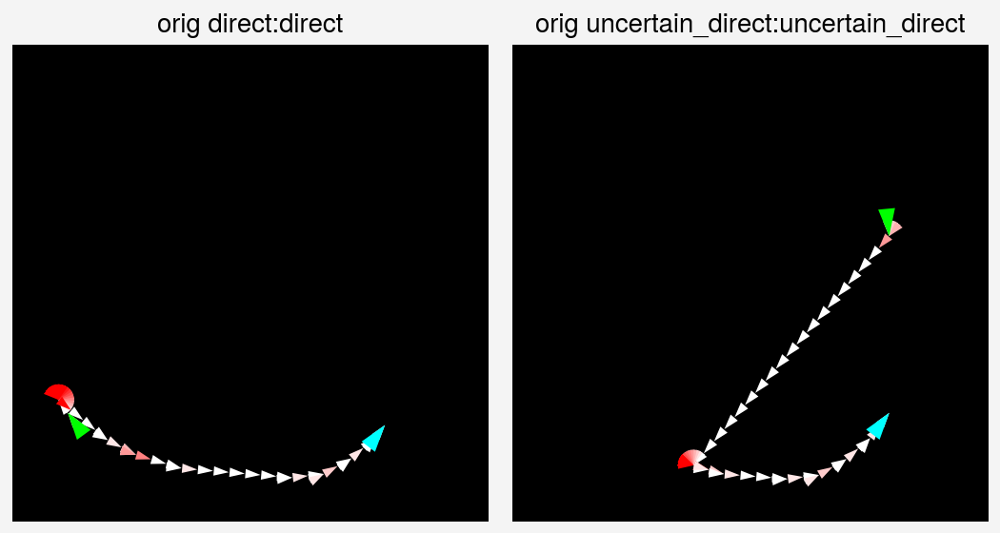

In [751]:
fig, ax = pplt.subplots(array=generate_grid_array(len(labels)))

titles = []
for i in range(len(labels)):
    idx = added_plot_idxs[i]
    draw_trajectory(ep_pos[idx], ep_angles[idx], fig=fig, ax=ax[i])
    
    label = id_to_label[labels[i]]
    titles.append(f'orig {pred_labels[idx]}:{label}')
        
# ax.format(title=[f'orig {pred_labels[idx]}:{labels[i]}' for i in plot_idxs])
ax.format(title=titles)

# UMAP activations during runs

In [40]:
batch = 32
aux = 'none'
trial = 0
chk = 600

exp_name = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}aux{aux}'
new_aux = False
                    
exp_name_t = f'{exp_name}_t{trial}'
env_kwargs = pickle.load(open(f'../trained_models/ppo/{exp_name}_env', 'rb'))
chk_path = Path('../trained_models/checkpoint/')/exp_name_t

model, obs_rms = torch.load(chk_path/f'{chk}.pt')
res = evalu(model, obs_rms, env_kwargs=env_kwargs, new_aux=new_aux, 
    auxiliary_truth_sizes=[1], n=100, data_callback=nav_data_callback,
    with_activations=True)


In [49]:
activs = torch.vstack([activ['shared_activations'][0] for activ in res['activations']])

In [12]:
import umap

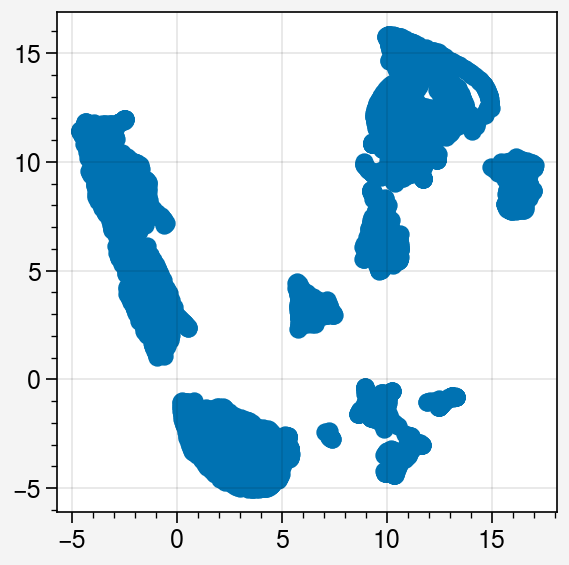

In [62]:
um = umap.UMAP()

activs_2d = um.fit_transform(activs)

fig, ax = pplt.subplots()
ax.scatter(activs_2d.T[0], activs_2d.T[1])

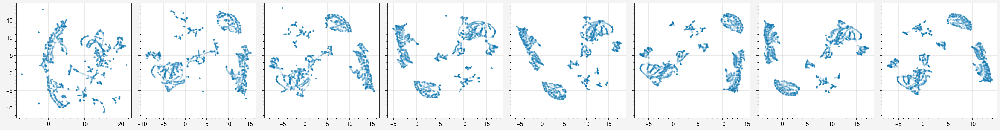

In [71]:
fig, ax = pplt.subplots(ncols=8)

for i in range(8):
    n_neighbors = 5+i
    um = umap.UMAP(n_neighbors=n_neighbors)

    activs_2d = um.fit_transform(activs)
    ax[i].scatter(activs_2d.T[0], activs_2d.T[1], alpha=0.1, s=4)

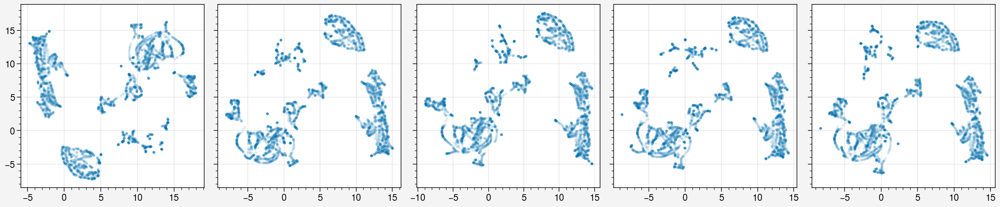

In [76]:
fig, ax = pplt.subplots(ncols=5)

for i in range(5):
    um = umap.UMAP(n_neighbors=8, transform_seed=i)

    activs_2d = um.fit_transform(activs)
    ax[i].scatter(activs_2d.T[0], activs_2d.T[1], alpha=0.1, s=4)

In [83]:
cres = class_res[batch][aux][trial][chk]
split_2d = split_by_ep(activs_2d, res['dones'])
split_2d = np.array(split_2d, dtype='object')

fig, ax = pplt.subplots()

rgb_colors = color_cycle('colorblind')

for i, key in enumerate(aranged_vocab):
    idxs = cres['idxs'] == key
    if idxs.any():
        split_2dtemp = np.vstack(split_2d[cres['idxs'] == key])
        ax.scatter(split_2dtemp.T[0], split_2dtemp.T[1], alpha=0.5, s=4, c=rgb_colors[i])

In [104]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters=3)
km.fit(activs_2d)

labels = km.labels_
fig, ax = pplt.subplots()
for label in np.unique(labels):
    d2 = activs_2d[labels == label]
    ax.scatter(d2.T[0], d2.T[1])

In [125]:
batch = 16
aux = 'none'
trial = 0
chk = 50

exp_name = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}aux{aux}'
new_aux = False
                    
exp_name_t = f'{exp_name}_t{trial}'
env_kwargs = pickle.load(open(f'../trained_models/ppo/{exp_name}_env', 'rb'))
chk_path = Path('../trained_models/checkpoint/')/exp_name_t

model, obs_rms = torch.load(chk_path/f'{chk}.pt')
res = evalu(model, obs_rms, env_kwargs=env_kwargs, new_aux=new_aux, 
    auxiliary_truth_sizes=[1], n=100, data_callback=nav_data_callback,
    with_activations=True)


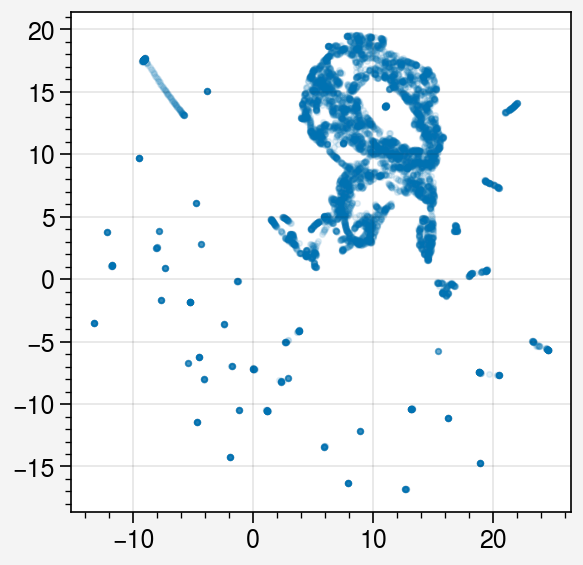

In [147]:
um = umap.UMAP(n_neighbors=12)

activs = torch.vstack([activ['shared_activations'][0] for activ in res['activations']])
activs_2d = um.fit_transform(np.array(activs, dtype='float32'))

fig, ax = pplt.subplots()
ax.scatter(activs_2d.T[0], activs_2d.T[1], s=4, alpha=0.1)


In [144]:
for batch in batch_sizes:
    for aux in aux_tasks:
        chks = all_chks[batch]
        for trial in trials:
            for chk in chks:
                
res_new = {'activs': np.array(activs, dtype='float16'), 'dones': res['dones']}
pickle.dump(res_new, open('data/umaps/test', 'wb'))

In [6]:
aux_tasks = ['none', 'catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_labels = ['Control', 'Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']
batch_sizes = [16, 32]
all_chks = {16: [0, 50, 100, 150, 300, 600, 1000, 1500],
            32: [0, 20, 40, 80, 150, 300, 600, 900]}
trials = range(1)

all_res = {}

for batch in batch_sizes:
    if batch not in all_res:
        all_res[batch] = {}
    
    chks = all_chks[batch]
    for aux in aux_tasks:
        if aux not in all_res[batch]:
            all_res[batch][aux] = {}
            
        for trial in tqdm(trials):
            if trial not in all_res[batch][aux]:
                all_res[batch][aux][trial] = {}
            new_aux = True
            if aux == 'none':
                exp_name = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}aux{aux}'
                new_aux = False
            else:
                exp_name = f'nav_pdistal_auxcatcoef1/nav_pdistal_batch{batch}aux{aux}coef1'
                
            exp_name_t = f'{exp_name}_t{trial}'
            env_kwargs = pickle.load(open(f'../trained_models/ppo/{exp_name}_env', 'rb'))
            chk_path = Path('../trained_models/checkpoint/')/exp_name_t
            
            for chk in chks:
                if chk in all_res[batch][aux][trial]:
                    continue
                model, obs_rms = torch.load(chk_path/f'{chk}.pt')
                res = evalu(model, obs_rms, env_kwargs=env_kwargs, new_aux=new_aux, 
                    auxiliary_truth_sizes=[1], n=100, data_callback=nav_data_callback,
                    with_activations=True)
                
                # Only keep dones and shared activations
                
                activs = torch.vstack([activ['shared_activations'][0] for activ in res['activations']])
                
                all_res[batch][aux][trial][chk] = {
                    'activs': activs,
                    'dones': res['dones']
                }


  0%|                                                                                            | 0/1 [01:36<?, ?it/s]

KeyboardInterrupt



In [11]:
all_res[16]['none'][0][50]['activs']

dict_keys(['activs', 'dones'])

In [ ]:
aux_tasks = ['none', ']
aux_labels = ['Control', 'Faced Wall', 'Position Quadrant', 'Categ. East/North Wall', 'Categ. East Wall', 'Categ. North Wall']
batch_sizes = [16, 32]
all_chks = {16: [0, 50, 100, 150, 300, 600, 1000, 1500],
            32: [0, 20, 40, 80, 150, 300, 600, 900]}
trials = range(10)

# all_res = {}

for batch in batch_sizes:
    if batch not in all_res:
        all_res[batch] = {}
    
    chks = all_chks[batch]
    for aux in aux_tasks:
        if aux not in all_res[batch]:
            all_res[batch][aux] = {}
            
        for trial in tqdm(trials):
            if trial not in all_res[batch][aux]:
                all_res[batch][aux][trial] = {}
            new_aux = True
            if aux == 'none':
                exp_name = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}aux{aux}'
                new_aux = False
            else:
                exp_name = f'nav_pdistal_auxcatcoef1/nav_pdistal_batch{batch}aux{aux}coef1'
                
            exp_name_t = f'{exp_name}_t{trial}'
            env_kwargs = pickle.load(open(f'../trained_models/ppo/{exp_name}_env', 'rb'))
            chk_path = Path('../trained_models/checkpoint/')/exp_name_t
            
            for chk in chks:
                if chk in all_res[batch][aux][trial]:
                    continue
                model, obs_rms = torch.load(chk_path/f'{chk}.pt')
                res = evalu(model, obs_rms, env_kwargs=env_kwargs, new_aux=new_aux, 
                    auxiliary_truth_sizes=[1], n=100, data_callback=nav_data_callback,
                    with_activations=True)
                
                # Only keep dones and shared activations
                
                activs = torch.vstack([activ['shared_activations'][0] for activ in res['activations']])
                
                all_res[batch][aux][trial][chk] = {
                    'activs': activs,
                    'dones': res['dones'],
                    'actions': res['actions'],
                    'data': res['data']
                }


 70%|██████████████████████████████████████████████████████████                         | 7/10 [08:54<04:03, 81.26s/it]

### Plot

In [13]:
um = umap.UMAP(n_neighbors=12)

fig, ax = pplt.subplots(ncols=len(chks))

for i, chk in enumerate(chks):
    activs = all_res[16]['none'][0][chk]['activs']
    
    activs = torch.vstack([activ['shared_activations'][0] for activ in res['activations']])
    activs_2d = um.fit_transform(np.array(activs, dtype='float32'))

    ax[i].scatter(activs_2d.T[0], activs_2d.T[1], s=4, alpha=0.1)



KeyboardInterrupt



Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x0000020B651D3310> (for post_execute):
Error in callback <function flush_figures at 0x0000020B651D3160> (for post_execute):



KeyboardInterrupt


KeyboardInterrupt



100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [01:16<00:00,  9.62s/it]


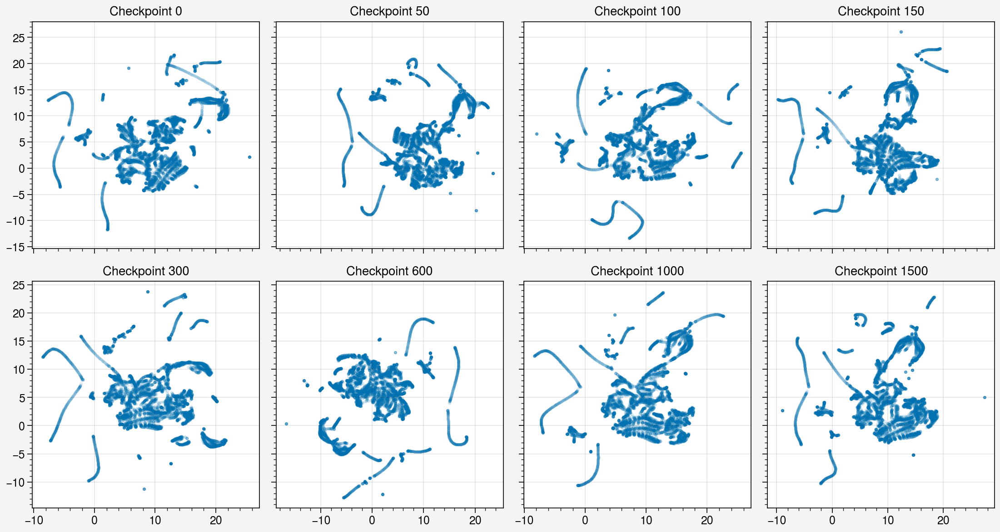

In [18]:

fig, ax = pplt.subplots(nrows=2, ncols=len(chks)//2)

for i, chk in enumerate(tqdm(chks)):
    um = umap.UMAP(n_neighbors=12)
    activs = all_res[16]['none'][0][chk]['activs']
    
    activs = torch.vstack([activ['shared_activations'][0] for activ in res['activations']])
    activs_2d = um.fit_transform(np.array(activs, dtype='float32'))

    ax[i].scatter(activs_2d.T[0], activs_2d.T[1], s=4, alpha=0.1)

ax.format(title=[f'Checkpoint {chk}' for chk in chks])

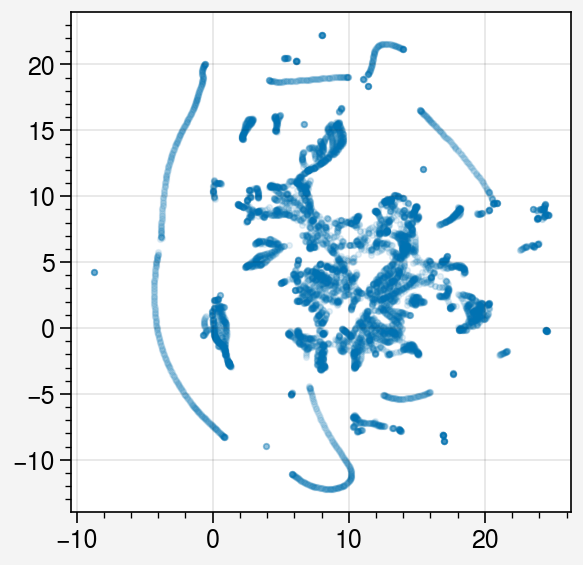

In [19]:

fig, ax = pplt.subplots()
chk = 1500
batch = 16
aux = 'none'
trial = 0

um = umap.UMAP(n_neighbors=8)
activs = all_res[batch][aux][trial][chk]['activs']

activs = torch.vstack([activ['shared_activations'][0] for activ in res['activations']])
activs_2d = um.fit_transform(np.array(activs, dtype='float32'))

ax.scatter(activs_2d.T[0], activs_2d.T[1], s=4, alpha=0.1)


In [26]:
class_res[batch][aux][trial][chk]['idxs']

array([1, 3, 1, 3, 3, 3, 1, 1, 3, 1, 3, 3, 4, 1, 1, 1, 3, 1, 3, 1, 3, 3,
       3, 3, 3, 4, 4, 3, 3, 3, 4, 1, 1, 4, 4, 3, 1, 3, 3, 1, 3, 1, 0, 1,
       1, 3, 3, 1, 1, 3, 3, 1, 3, 4, 3, 3, 3, 3, 1, 3, 1, 1, 4, 3, 1, 3,
       3, 4, 1, 3, 3, 1, 1, 3, 3, 4, 3, 3, 4, 3, 3, 3, 3, 3, 1, 2, 1, 3,
       1, 1, 0, 3, 3, 3, 1, 1, 3, 4, 4, 4], dtype=int64)

In [27]:
learner.dls.vocab

['circling', 'direct', 'stuck', 'test_corner', 'uncertain_direct']

In [36]:
activs_2d_split = split_by_ep(activs_2d, all_res[batch][aux][trial][chk]['dones'])


In [57]:
chks

[0, 50, 100, 150, 300, 600, 1000, 1500]

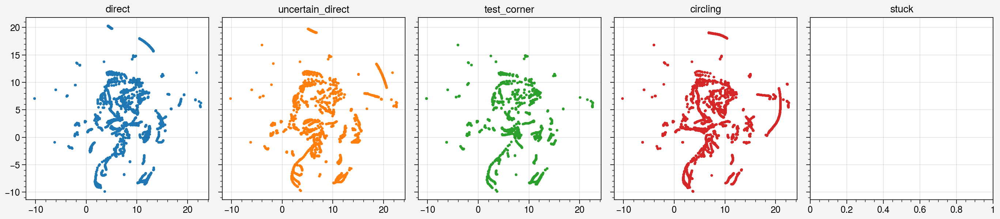

In [60]:
chk = 600
batch = 16
aux = 'none'
trial = 0

um = umap.UMAP(n_neighbors=8)
activs = all_res[batch][aux][trial][chk]['activs']

activs = torch.vstack([activ['shared_activations'][0] for activ in res['activations']])
activs_2d = um.fit_transform(np.array(activs, dtype='float32'))


idxs = class_res[batch][aux][trial][chk]['idxs']
activs_2d_split = np.array(split_by_ep(activs_2d, all_res[batch][aux][trial][chk]['dones']), 
                           dtype='object')

fig, ax = pplt.subplots(ncols=len(aranged_vocab))

for n, idx in enumerate(aranged_vocab):
    if np.sum(idxs == idx) > 0:
        activ_plot = np.vstack(activs_2d_split[idxs == idx])
        ax[n].scatter(activ_plot.T[0], activ_plot.T[1], c=rgb_colors[n], s=4)
    
ax.format(title=list(aranged_vocab.values()))
    

In [5]:

batch_sizes = [16, 32]
# batch_sizes = [32]
# aux_tasks = ['catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
# aux_tasks = ['wall0', 'wall1', 'wall01', 'goaldist', 'terminal']
# auxiliary_truth_sizes = [[1], [1], [1, 1],  [1], [1]]

# aux_tasks = ['none', 'catfacewall', 'catquad', 'catwall01', 'catwall0', 'catwall1']
aux_tasks = ['rewexplore', 'rewdist']

trials = range(10)
# all_chks = {16: [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
#         170, 190, 210, 230, 250, 270, 300, 350, 400, 450, 500, 550, 600,
#         650, 700, 750, 800, 850, 900, 950, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800],
#             32: [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150,
#         170, 190, 210, 230, 250, 270, 300, 350, 400, 450, 500, 550, 600,
#         650, 700, 750, 800, 850, 900]}

#Much fewer checkpoints to test since they mostly result in the same things anyways
all_chks = {16: [0, 50, 100, 150, 300, 600, 1000, 1500],
            32: [0, 20, 40, 80, 150, 300, 600, 900]}


keep_keys = ['actions',  'data',  'dones']


all_res = {}
all_res_ref = {}

for i, batch in enumerate(batch_sizes):
    all_res[batch] = {}
    all_res_ref[batch] = {}
    for aux in aux_tasks:
        all_res[batch][aux] = {}
        all_res_ref[batch][aux] = {}
        # for trial in trials:
        #     all_res[batch][aux][trial] = {}
        #     all_res_ref[batch][aux][trial] = {}
            
            
if __name__ == '__main__':
    for i, batch in enumerate(batch_sizes):
        for j, aux in enumerate(aux_tasks):
            for trial in tqdm(trials):
                print(f'Batch {batch}, aux {aux}, trial {trial}')
                
                '''A. Compute grads ref grads for categorical grads'''
                
                # exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}coef1'
                # exp_name_t = f'{exp_name}_t{trial}'
                
                # # _, _, env_kwargs = load_model_and_env(exp_name, 0)
                # env_kwargs = pickle.load(open(f'../trained_models/ppo/{exp_name}_env', 'rb'))
                # chk_path = Path('../trained_models/checkpoint/')/exp_name_t
                # chks = all_chks[batch]
                
                # #Load first checkpoint and warm up reward normalization
                # model, obs_rms = torch.load(chk_path/f'{chks[0]}.pt')
                # agent, envs, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=128,
                #                                         num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                #                                             agent_base='DecomposeGradPPOAux', new_aux=True,
                #                                             auxiliary_truth_sizes=auxiliary_truth_sizes[j], log_dir='tmp')
                # obs = storage.obs[0].clone()
                # res = collect_batches_and_grads(agent, envs, storage, 20, decompose_grads=True, new_aux=True)

                # cs_means = []
                # for chk in tqdm(chks):
                #     model, obs_rms = torch.load(chk_path/f'{chk}.pt')
                #     obs = storage.obs[-1].clone()
                #     envs.venv.obs_rms = obs_rms
                    
                #     #Collect small batches
                #     agent, _, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=collect_batch,
                #                                             num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                #                                             make_env=False, obs=obs, agent_base='DecomposeGradPPOAux', new_aux=True, 
                #                                                 auxiliary_truth_sizes=auxiliary_truth_sizes[j])


                #     res = collect_batches_and_grads(agent, envs, storage, num_batches=20, decompose_grads=True,
                #                                     new_aux=True)
                #     all_res[batch][aux][trial][chk] = res
                    
                #     #Collect ref batches
                #     agent, _, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=ref_collect_batch,
                #                                             num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                #                                             make_env=False, obs=obs, agent_base='DecomposeGradPPOAux', new_aux=True, 
                #                                                 auxiliary_truth_sizes=auxiliary_truth_sizes[j])


                #     res = collect_batches_and_grads(agent, envs, storage, num_batches=3, decompose_grads=True,
                #                                     new_aux=True)
                #     all_res_ref[batch][aux][trial][chk] = res
                
                
                '''B. Compute ref grads for old auxiliary task methods '''
                    
                # exp_name = f'nav_pdistal_batchauxcoef1/nav_pdistal_batch{batch}aux{aux}coef1'
                # exp_name_t = f'{exp_name}_t{trial}'
                
                # env_kwargs = pickle.load(open(f'../trained_models/ppo/{exp_name}_env', 'rb'))
                # chk_path = Path('../trained_models/checkpoint/')/exp_name_t
                # chks = all_chks[batch]
                

                # #Load first checkpoint and warm up reward normalization
                # model, obs_rms = torch.load(chk_path/f'{chks[0]}.pt')
                # agent, envs, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=128,
                #                                         num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                #                                             agent_base='DecomposeGradPPO', log_dir='tmp', new_aux=False)
                # obs = storage.obs[0].clone()
                # res = collect_batches_and_grads(agent, envs, storage, 20, decompose_grads=True)


                # cs_means = []
                # for chk in tqdm(chks):
                #     model, obs_rms = torch.load(chk_path/f'{chk}.pt')
                #     obs = storage.obs[-1].clone()
                #     envs.venv.obs_rms = obs_rms
                #     agent, _, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=collect_batch,
                #                                             num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                #                                             make_env=False, obs=obs, agent_base='DecomposeGradPPO', new_aux=False)


                #     res = collect_batches_and_grads(agent, envs, storage, num_batches=20,
                #                                     decompose_grads=True)
                #     all_res[batch][aux][trial][chk] = res


                #     # Collect ref batches
                #     agent, _, storage = initialize_ppo_training(model, obs_rms, env_kwargs=env_kwargs, num_steps=ref_collect_batch,
                #                                             num_processes=collect_processes, ppo_epoch=1, take_optimizer_step=False, normalize=True,
                #                                             make_env=False, obs=obs, agent_base='DecomposeGradPPO', new_aux=False)


                #     res = collect_batches_and_grads(agent, envs, storage, num_batches=3,
                #                                     decompose_grads=True)
                #     all_res_ref[batch][aux][trial][chk] = res


                '''C. Collect trajectories'''
                # chks = all_chks[batch]
                
                # new_aux = True
                # if aux == 'none':
                #     exp_name = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}aux{aux}'
                #     new_aux = False
                # else:
                #     exp_name = f'nav_pdistal_auxcat/nav_pdistal_batch{batch}aux{aux}coef1'
                    
                # exp_name_t = f'{exp_name}_t{trial}'
                # env_kwargs = pickle.load(open(f'../trained_models/ppo/{exp_name}_env', 'rb'))
                # chk_path = Path('../trained_models/checkpoint/')/exp_name_t
                
                # for chk in chks:
                #     if chk in all_res[batch][aux][trial]:
                #         continue
                #     model, obs_rms = torch.load(chk_path/f'{chk}.pt')
                #     res = evalu(model, obs_rms, env_kwargs=env_kwargs, new_aux=new_aux, 
                #         auxiliary_truth_sizes=[1], n=100, data_callback=nav_data_callback,
                #         eval_log_dir='tmp')
                    
                #     for key in list(res.keys()):
                #         if key not in keep_keys:
                #             del res[key]
                            
                #     all_res[batch][aux][trial][chk] = res
                
                
                '''D. Collect trajectories for aux rewards'''
                chks = all_chks[batch]
                
                new_aux = False
                exp_name = f'nav_pdistal_batchaux/nav_pdistal_batch{batch}aux{aux}'
                    
                exp_name_t = f'{exp_name}_t{trial}'
                env_kwargs = pickle.load(open(f'../trained_models/ppo/{exp_name}_env', 'rb'))
                chk_path = Path('../trained_models/checkpoint/')/exp_name_t
                
                if not chk_path.exists():
                    print(f'{chk_path} does not exist')
                    continue
                else:
                    if trial not in all_res[batch][aux]:
                        all_res[batch][aux][trial] = {}
                
                for chk in chks:
                    if chk in all_res[batch][aux][trial]:
                        continue
                    model, obs_rms = torch.load(chk_path/f'{chk}.pt')
                    res = evalu(model, obs_rms, env_kwargs=env_kwargs, new_aux=new_aux, 
                        auxiliary_truth_sizes=[1], n=100, data_callback=nav_data_callback,
                        eval_log_dir='tmp', with_activations=True)
                    
                    keep_res = {}
                    for key in keep_keys:
                        keep_res[key] = res[key]
                    #additionally add shared activations
                    activs = torch.vstack([activ['shared_activations'][0] for activ in res['activations']])
                    keep_res['activs'] = activs
                    
                    all_res[batch][aux][trial][chk] = res

  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

Batch 16, aux rewexplore, trial 0


  0%|                                                                                           | 0/10 [01:17<?, ?it/s]


KeyboardInterrupt: 